## <u>**Purpose of the assignment**</u><br>
## The purpose of the assignment is to familiarize you with the basic steps of the process followed for the application of data mining techniques, namely: pre-processing / cleaning, transformation, application of data mining techniques and evaluation. The implementation will be done in the Python programming language using the tools/libraries: jupyter notebook, pandas and SciKit Learn.

##<u>**Description**</u><br>
## **Goodreads** is a social platform combined with a book database that is quite similar to IMDb for movies: users can search for books, tag them, share their thoughts and discuss. Most importantly, they can rate the books they've read on a scale of 1 to 5 and discover new books to read. Our goal is to study a subset of data from this platform and create a program that recommends books. Another goal of the paper is to automatically categorize books into their genre based on their descriptions. Finally, those who want can use the book covers to make a simple image retrieval system based on its content (**bonus**).

## The file you will use is the Best Books Ever Dataset. The file can be seen in the zenodo repository at the link below (there you will also find the button to download it) [https://zenodo.org/record/4265096#.Y-N2DnbP1jE.](https://zenodo.org/record/4265096#.Y-N2DnbP1jE.)

# Import essential libraries


In [ ]:
import os
import csv
import time
import urllib.request
import sys
import pickle

import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
%matplotlib inline
import seaborn as sns

import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.model_selection import cross_validate, train_test_split, cross_val_score
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score

from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report

import cv2

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


# Mount gdrive to read data

In [ ]:
# Import google drive and define the path to the folder where the data is stored
from google.colab import drive

drive.mount('/content/gdrive', force_remount = True)
PATH = '/content/gdrive/MyDrive/data_mining_data/'
COVERS = "/content/gdrive/MyDrive/data_mining_data/covers/"
SIMILARITIES = "/content/gdrive/MyDrive/data_mining_data/similarities/"
CLASSIFICATIONS = "/content/gdrive/MyDrive/data_mining_data/classifications/"
GLOVES = "/content/gdrive/MyDrive/data_mining_data/classifications/gloves/"

Mounted at /content/gdrive


# Load/Save .pkl

In [ ]:
def load_option(PATH, PKL):
  with open(PATH + PKL, 'rb') as file:
    return pickle.load(file)

def save_option(PATH, PKL):
  with open(PATH, 'wb') as file:
    pickle.dump(PKL, file)

##<u>**Requirments**</u><br>
## First you will import the entire file into a dataframe and study if there are any Nan values in the columns to remove those rows from the dataframe. Then you will write the appropriate commands in python to answer the following requests. Most of the times the answers will be given with a graph and you can use any python library you want for this purpose.

In [ ]:
# csv -> dataframe
df = pd.read_csv(PATH + "books_1.Best_Books_Ever.csv")
print(f"The original dataframe has {df.shape[0]} rows x {df.shape[1]} columns")

The original dataframe has 52478 rows x 25 columns


In [ ]:
def clean_up_from_nan(df, columns):
  for column in columns:
    df.dropna(subset=[column], inplace=True)
  return df

In [ ]:
columns = ["bookId",
          "title",
          "author",
          "description",
          "language",
          "genres",
          "pages",
          "publisher",
          "publishDate",
          "numRatings",
          "ratingsByStars"]
cleaned_df = clean_up_from_nan(df, columns)
# cleaned_df = df.dropna()
print(f"The cleaned dataframe has {cleaned_df.shape[0]} rows x {cleaned_df.shape[1]} columns")

The cleaned dataframe has 44034 rows x 25 columns


##**Preprocessing (10%)**
## Notice the ratingsByStars column, it contains 5 values separated by commas, split these values and add to the dataframe separately the ratings, i.e. ratingStar5, ratingStar4, ratingStar3 etc.

In [ ]:
# For every rating (row) we pass the value into eval which helps us
# convert the string representation of a list into an actual list of integers.
# At last, I also make the convertion to int since we are gonna use it later on.
ratestar_df = cleaned_df.copy()
ratestar_df = ratestar_df[ratestar_df["ratingsByStars"] != "[]"]
data = []
for rate in ratestar_df["ratingsByStars"]:
  data += [[int(x) for x in eval(rate)]]
# For every rating star we make a new column with elements the corresponding
# element from all the lists we calculated before
for i in range(5):
  ratestar_df["ratingStar" + str(5-i)] = [data[j][i] for j in range(len(data))]
# Print results to make sure everything is fine
ratestar_df.loc[:, "ratingStar5":"ratingStar1"]

,ratingStar5,ratingStar4,ratingStar3,ratingStar2,ratingStar1
0,3444695,1921313,745221,171994,93557
1,1593642,637516,222366,39573,14526
2,2363896,1333153,573280,149952,80794
3,1617567,816659,373311,113934,76770
4,1751460,1113682,1008686,542017,548674
...,...,...,...,...,...
52473,311,310,197,42,11
52474,16,14,5,2,0
52475,2109,1868,1660,647,390
52476,77,78,59,19,5


## Also the genres column contains for each book more than one genre. Create a new column (name it genreSingle) and put only the first genre of all the genres found in each line. (eg ['Fantasy', 'Young Adult', 'Fiction', 'Magic', 'Childrens', 'Adventure', 'Audiobook', 'Middle Grade', 'Classics', 'Science Fiction Fantasy'] -> the new column will have 'Fantasy' ) deleting books without any genre information.

In [ ]:
# First we make sure to delete rows that don't have any type of genre
# Then we search the value for the first occurence of a word inside single quote
# The first occurence will then be the value of the new column
# If we don't find a possible match for regex we will fill the value with Nan
# which we will drop after
genre_df = ratestar_df.copy()
genre_df = genre_df[genre_df["genres"] != "[]"]
genre_df["genreSingle"] = [re.search(r"'(\w+\s*\w*)'", genre).group(1) if re.search(r"'(\w+\s*\w*)'", genre) else np.nan for genre in genre_df["genres"]]
genre_df = genre_df.loc[genre_df["genreSingle"].notna()]
# Print results to make sure everything is fine
genre_df["genreSingle"]

0        Young Adult
1            Fantasy
2           Classics
3           Classics
4        Young Adult
            ...     
52473       Vampires
52474        Mystery
52475        Fantasy
52476        Fiction
52477    Lds Fiction
Name: genreSingle, Length: 41566, dtype: object

## Use the publishDate column and create a new column with the publication year of each book (you can use the to_datetime() method provided by pandas or whatever you want).

In [ ]:
# Convert the publishDate column into datetime
# Because of the fact that the input has many date formats we are infer_date_format
# Which will automatically find the date format. Last but not least, we are using
# coerce which will fill the formats that are not recognized with Nat and then we can drop them
year_df = genre_df.copy()
year_df["publishDate"] = pd.to_datetime(year_df["publishDate"], infer_datetime_format=True, errors='coerce')
year_df = year_df[year_df["publishDate"].notna()].copy()
year_df["publishYear"] = year_df["publishDate"].dt.year.astype("int64")
# Copy the new dataframe for later usage
df = year_df.copy()
# Print results to make sure everything is fine
year_df["publishYear"]

0        2008
1        2004
2        2006
3        2000
4        2006
         ... 
52473    2011
52474    2011
52475    2011
52476    2011
52477    2011
Name: publishYear, Length: 41264, dtype: int64

## **Questions to study the data (20%)**

# Plotting function
Since we were asked to plot data multiple times I preferred to make functions which given the data, the labels and the title it will make the corresponding graph.

In [ ]:
def bar_chart(data, size, show, title):
  ax = sns.barplot(x=data[0], y=data[1], data=df, errorbar = None)
  ax.bar_label(ax.containers[0], fmt='%.0f')
  ax.ticklabel_format(style='plain', axis='x')
  plt.title(title)
  if show:
    plt.show()

def histogram(data, labels, show, title):
  # plt.style.use("seaborn-v0_8")
  plt.style.use("ggplot")
  sns.histplot(data = data)
  plt.xlabel(labels[0])
  plt.ylabel(labels[1])
  plt.title(title)
  if show:
    plt.show()

1. ### Construct the histogram of the ratings in the data set (use the rating column)

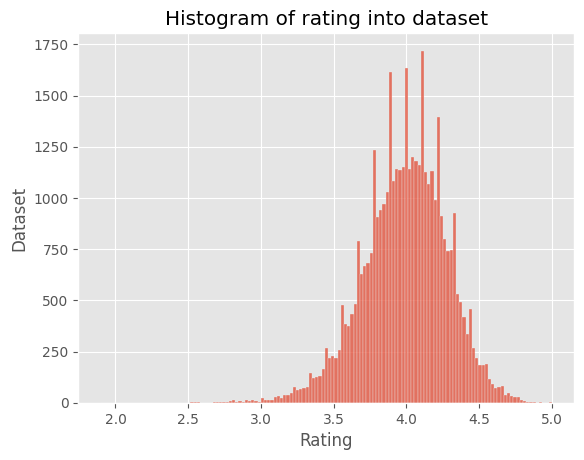

In [ ]:
histogram(df["rating"], ["Rating", "Dataset"], True, "Histogram of rating into dataset")

2. ### What are the 10 books with the most pages.

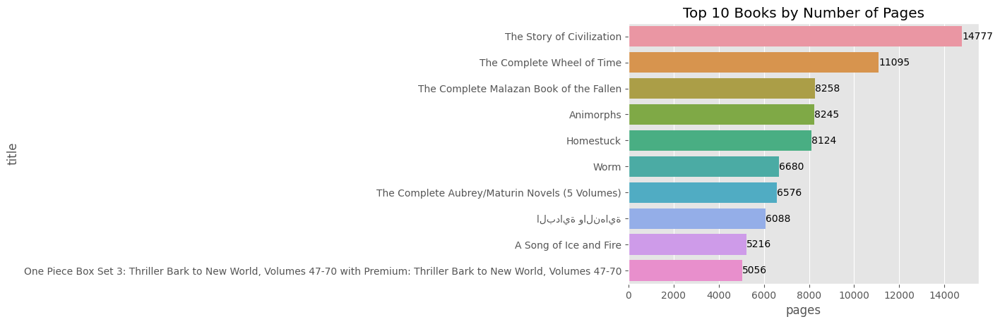

In [ ]:
# We need to make sure that the column has only numeric values so, we are gonna
# convert the "pages" into int64 and use the coerce. If something can not be
# converted it will be filled with Nan which we will drop before the print
misvalues = pd.to_numeric(df["pages"], errors="coerce").isna()
df = df[~misvalues].copy()
df["pages"] = df["pages"].astype("int64")
# We sort the dataframe and take the first 10 elements
top_10 = df.sort_values(by='pages', ascending=False).head(10)
# We proceed by ploting them
bar_chart([top_10["pages"], top_10["title"]], None, True, "Top 10 Books by Number of Pages")

3. ### What are the 10 books with the most 5-star ratings (use only the books that have received more than 10,000 5-star ratings from the ratingStar5 column) .

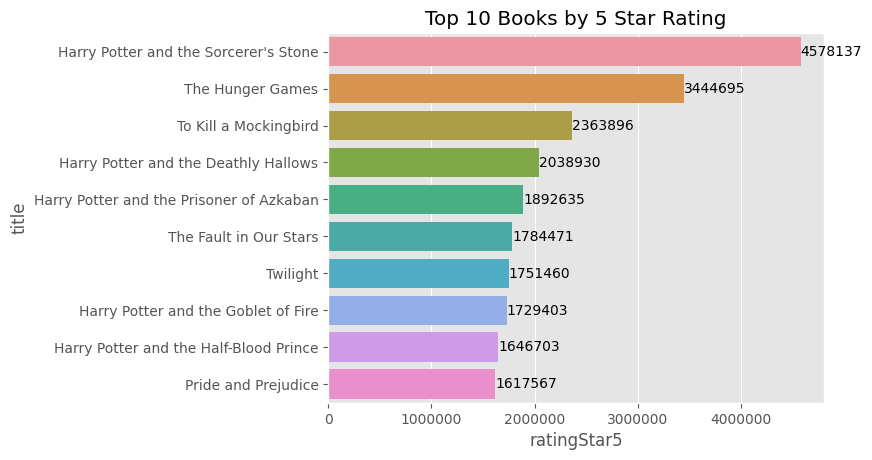

In [ ]:
# Firstly we make sure that the number of 5 star ratings are more than 10000
# Then we proceed by sort the values in descending order and take the first 10 values
# We don't need to take cases for Nan values because we covered it when creating this
# column to drop those with Nan
top_10 = df[df["ratingStar5"] > 10000].sort_values(by = "ratingStar5", ascending = False).head(10)
bar_chart([top_10["ratingStar5"], top_10["title"]], None, True, "Top 10 Books by 5 Star Rating")

4. ### Who are the 10 publishers who have published the most books.

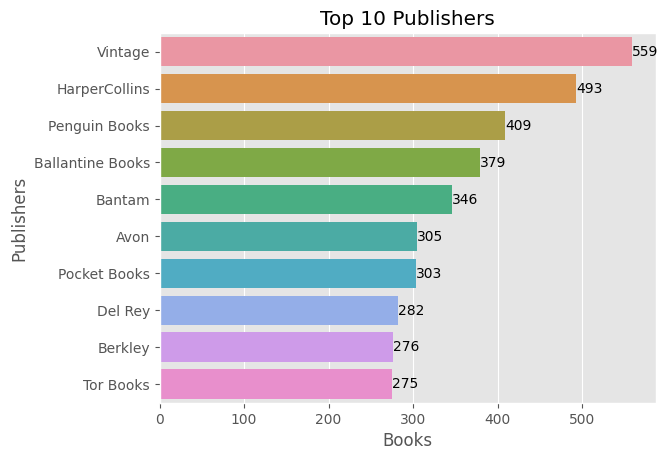

In [ ]:
top = df['publisher'].value_counts().sort_values(ascending = False).head(10)
bar_chart([top.values, top.index], None, None, "Top 10 Publishers")
plt.xlabel("Books")
plt.ylabel("Publishers")
plt.show()

## **Υλοποίηση Recommendation system (35%)**


### The goal of such a system is to (1) predict a user's ratings for books he has not read yet, and (2) display a ranked list of the top **N** books we believe they would like to know more. Another goal of a Recommender is (3) to help users discover relevant books that they would not have found otherwise.

###In this question you will need the columns<br> BookId<br> Description<br> And only those rows that have the language “English”.

In [ ]:
# We are getting only the rows that has a language English
# Also take the two columns we are going to use BookId and Description
df_english = df[df["language"] == "English"]

###Create the **TF-IDF** (Term Frequency - Inverse Document Frequency) table of unigrams and bigrams for the description column (use the stop_word parameter of TfidfVectorizer).

<u>**Explanation**</u><br>
I'm going to create the **TF-IDF** arrays for both unigrams and bigrams. I will do it using a one-line for loop with a combination of a list. The first element of the list will represent the unigram and the second will represent the bigram. I preferred to use the `stopwords` module from the `nltk` library becausem, `NLTK's stopwords` collection is more extensive and includes a broader range of common `stopwords` compared to the default `stopwords` in `TfidfVectorizer`. It covers a wide range of frequently occurring words like `pronouns`, `conjunctions`, `prepositions`, and other common functional words that may not contribute much to the overall meaning of a document.


I will also make a copy of the `df_english` dataframe to process the description column more. In order to achieve better similarity I'm going to remove punctuation marks, converting all characters to lowercase, etc. Since we are going to use them for the next question too I made that all of that a function. Finally, I'm performing lemmatization.

In [ ]:
def clean_descriptions(descriptions):
    # new_descriptions = [re.sub("[^a-z]"," ", description.lower()) for description in descriptions]
    new_descriptions = []
    # We are removing every character that is not a letter and store them in a list
    for description in descriptions:
      new_dec = re.sub("[^a-z]"," ", description.lower())
      # I'm also going to remove the stop words here as well
      cleaned_words = [word for word in word_tokenize(new_dec) if not word in stopwords.words('english')]
      # Lastly I'm going to perform lemmatization
      new_descriptions.append(' '.join([WordNetLemmatizer().lemmatize(word) for word in cleaned_words]))
    # Then return that list
    return new_descriptions

In [ ]:
# First we copy the dataframe
df_english_cleaned = df_english.copy()
# Now we will clean the description column in order to achieve better similarity
df_english_cleaned['description'] = clean_descriptions(df_english_cleaned['description'])

In [ ]:
# First we are declaring the vectors
vectors = [TfidfVectorizer(max_df=1.0, min_df=2, max_features=1000, ngram_range=(i,i)) for i in range(1,3)]

# Fit and Transform both vectors
transformed = [vector.fit_transform(df_english_cleaned["description"]) for vector in vectors]

# Extract the arrays in order to make the DataFrames
arrays = [transform.toarray() for transform in transformed]

# Create the DataFrames
dfs = [pd.DataFrame(array, columns = vector.get_feature_names_out(), index = df_english_cleaned['bookId']) for (array, vector) in zip(arrays, vectors)]

### **Cosine Similarity**: This metric calculates the similarity between two vectors x,y, using the angle between them (when the angle is 0 it means that x and y are equal, if we exclude their length). Go through the TF-IDF table and calculate the similarity of each book to the rest. Store in a python dictionary the 100 most similar books. Prediction: Make a function that takes as input an id and an integer N, and returns the N most similar books.

In [ ]:
cosine_similarities = [cosine_similarity(dataframe, dataframe) for dataframe in dfs]

<u>**Explanation**</u><br>
I made a function which given an array of similarities it makes a dictionary with the top 100 similar books for every book.

In [ ]:
def make_dictionary(similarity, elements):
  # Initialize dictionary
  dictionary = {}
  # Use enumerate to be able to get both index and the data
  for i, row in enumerate(similarity):
      # Delete the self-similarity from both data and indexes
      indexes, similarities = (np.delete(np.arange(len(row)), i), np.delete(row, i))
      # Wer are using argsort to sort the indexes then ::-1 to reverse the list and
      # finally :elements to get the top elements similarities
      top_indexes = indexes[np.argsort(similarities)[::-1][:elements]]
      top_similarities = similarities[np.argsort(similarities)[::-1][:elements]]
      # Store selected similarities in the dictionary
      dictionary[i] = list(zip(top_indexes, top_similarities))
  # Lastly return the dictionary
  return dictionary

<u>**Explanation**</u><br>
Now I make a list for both unigram and bigram dictionary. As I said before the first element represent the unigram and the second the bigram.

In [ ]:
dictionaries = [make_dictionary(similarity, 100) for similarity in cosine_similarities]
save_option(SIMILARITIES + 'dictionary.pkl', dictionaries)

# <u>**Disclaimer**</u><br>
The total data after preprocessing is about 37k. As you already understand, it was impossible to run in colab as it crashed in the first cosine similarity due to lack of RAM. In order to have the best results, I preferred to locally execute the two code cells below and then save the results of the dictionary in *.pkl file which I then uploaded to google drive and load as exactly indicated in the next question.

In [ ]:
dictionaries = load_option(SIMILARITIES, 'dictionary.pkl')

<u>**Explanation**</u><br>
Now, I will make a function which given the `bookId` and the `N`, it will find and print the books if and only if the bookId exists in the dataset. I'm also returning similarities for both unigram and bigram.

In [ ]:
# I reset the index because we will need it, also from now on I'm going to use
# the previous dataset in order to ensure that the description column is intact
# when I will print it
df_english = df_english.reset_index(drop=True)

In [ ]:
def recommend(bookId, N):
  try:
    # We are extracting the index of the current book (if it exists) because the dictionaries
    # was created based on the indexes
    id = int(df_english.index[df_english["bookId"] == bookId][0])
  except:
    print(f"The bookId \"{bookId}\" is not valid.")
    return None, None
  # We will return the similarities for both unigram and bigram
  return  dictionaries[0][id][:N], dictionaries[1][id][:N]

### recommend(item_id = 4085439, num = 5)


### The output of the function should be of the following format
Recommending 5 books similar to: The Hunger Games

-------------------------------------------------------

Recommended: NAME <br>
Description: DESCRIPTION<br>
(score:0.12235188993161432)<br>

Recommended: NAME<br>
Description: DESCRIPTION<br>
(score:0.12235188993161432)<br>
…………

<u>**Explanation**</u><br>
Finally, I will make a function which given the informations it will print the books like the pronuncation says above.

In [ ]:
def beautifier_print(bookId, N, uni, bi):
  # We check that the book exists
  if uni == None and bi == None:
    return
  # We take the title of the book which are looking for similars in order to print
  outer_title = df_english.iloc[int(df_english.index[df_english["bookId"] == bookId][0])]['title']
  # Make the format as we were said to
  print(f"Recommending {N} books similar to: {outer_title} with unigram")
  print("-----------------------------------------------------------------")
  # For every tuple which consists of (index, score)
  # Use the index to find both title and description and then print the score
  for book in uni:
    print(f"Recommended:{df_english.iloc[book[0]]['title']}")
    print(f"Description:{df_english.iloc[book[0]]['description']}")
    print(f"score: {book[1]}", end = "\n\n")
  # Same as before
  print(f"\nRecommending {N} books similar to: {outer_title} with bigram")
  print("------------------------------------------------------------------")
  for book in bi:
    print(f"Recommended:{df_english.iloc[book[0]]['title']}")
    print(f"Description:{df_english.iloc[book[0]]['description']}")
    print(f"score: {book[1]}", end = "\n\n")

Below are some tests in order to ensure that the function works.

In [ ]:
bookId, N = "2.Harry_Potter_and_the_Order_of_the_Phoenix", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: Harry Potter and the Order of the Phoenix with unigram
-----------------------------------------------------------------
Recommended:Think Fast or Die
Description:How do you start a war?  Assassinate a prominent American arms dealer.How do you deal with a growing threat of terrorism spread across the world? Find black-ops agent Rick Jensen. The covert terror cell with a clandestine leader that no government or agency can identify.A Kurdish soldier slave who could hold the key to unmasking the mastermind terrorist.Looted ancient antiquities funding terror on a mass scale.The clock is ticking. No rules except think fast or die… Rick has narrowly escaped a hidden army base deep in the Pakistan desert. Injured and exhausted, he tackles a series of terror incidents starting with bomb plot that would kill ten thousand people. No one else can stop the cell.   A new handler is assigned to Rick who needs him fighting the terrorists in Syria.  He hates Syria but 

In [ ]:
bookId, N = "2767052-the-hunger-games", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: The Hunger Games with unigram
-----------------------------------------------------------------
Recommended:Vorkosigan's Game: The Vor Game \ Borders of Infinity
Description:Omnibus of The Vor Game and the novella "Borders of Infinity".
score: 0.37189783041213753

Recommended:The Player of Games
Description:The Culture - a humanoid/machine symbiotic society - has thrown up many great Game Players. One of the best is Jernau Morat Gurgeh, Player of Games, master of every board, computer and strategy. Bored with success, Gurgeh travels to the Empire of Azad, cruel & incredibly wealthy, to try their fabulous game, a game so complex, so like life itself, that the winner becomes emperor. Mocked, blackmailed, almost murdered, Gurgeh accepts the game and with it the challenge of his life, and very possibly his death.
score: 0.3367648053129542

Recommended:The Quillan Games
Description:LET THE GAMES BEGIN....Quillan is a territory on the verge of destruction. Th

In [ ]:
bookId, N = "2657.To_Kill_a_Mockingbird", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: To Kill a Mockingbird with unigram
-----------------------------------------------------------------
Recommended:Go Set a Watchman
Description:From Harper Lee comes a landmark new novel set two decades after her beloved Pulitzer Prize-winning masterpiece, To Kill a Mockingbird. Maycomb, Alabama. Twenty-six-year-old Jean Louise Finch—"Scout"—returns home from New York City to visit her aging father, Atticus. Set against the backdrop of the civil rights tensions and political turmoil that were transforming the South, Jean Louise's homecoming turns bittersweet when she learns disturbing truths about her close-knit family, the town and the people dearest to her. Memories from her childhood flood back, and her values and assumptions are thrown into doubt. Featuring many of the iconic characters from To Kill a Mockingbird, Go Set a Watchman perfectly captures a young woman, and a world, in a painful yet necessary transition out of the illusions of the past—a 

In [ ]:
bookId, N = "1885.Pride_and_Prejudice", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: Pride and Prejudice with unigram
-----------------------------------------------------------------
Recommended:Mr. Darcy Presents His Bride: A Sequel to Jane Austen's Pride and Prejudice
Description:IN PRIDE & PREJUDICE, JANE AUSTEN brought together one of the most beloved literary couples of all time—Elizabeth Bennet and Fitzwilliam Darcy. Now, Mr. Darcy Presents His Bride continues the story of these passion-filled newlyweds as they enter London’s glamorous high society. This page-turning novel finds Elizabeth and Mr. Darcy entangled in the frivolity and ferocity of social intrigues. Although Elizabeth makes a powerful friend in the Marchioness of Englebury, the rivalry and jealousy among her ladyship’s prestigious clique threatens to destroy the success of her new marriage. Written in the style of Jane Austen, full of humor and sardonic wit, Mr. Darcy Presents His Bridebrings Regency society vividly to life and continues the romantic, sometimes tragi

In [ ]:
bookId, N = "11330278-wayward-son", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: Wayward Son with unigram
-----------------------------------------------------------------
Recommended:The Bone Labyrinth
Description:A war is coming, a battle that will stretch from the prehistoric forests of the ancient past to the cutting-edge research labs of today, all to reveal a true mystery buried deep within our DNA, a mystery that will leave readers changed forever . . .In this groundbreaking masterpiece of ingenuity and intrigue that spans 50,000 years in human history, New York Times bestselling author James Rollins takes us to mankind’s next great leap.But will it mark a new chapter in our development . . . or our extinction?In the remote mountains of Croatia, an archaeologist makes a strange discovery:  a subterranean Catholic chapel, hidden for centuries, holds the bones of a Neanderthal woman. In the same cavern system, elaborate primitive paintings tell the story of an immense battle between tribes of Neanderthals and monstrous shadowy 

In [ ]:
bookId, N = "10991547-daughter-of-helaman", 5
uni, bi = recommend(bookId, N)
beautifier_print(bookId, N, uni, bi)

Recommending 5 books similar to: Daughter of Helaman with unigram
-----------------------------------------------------------------
Recommended:Meeting God at Every Turn
Description:Is there a God who cares about me? Will he show me the right thing to do? Will he forgive and heal me? In Meeting God at Every Turn, Catherine Marshall gives readers a resounding Yes! to these questions and more as she describes how she met God at the confusing, troubled, and scary points in her life. The twelve turnings that Marshall describes are the type of events that shape a person: growing up, love and marriage, facing death, making a living, starting over in relationships and business, and more. Meeting God at Every Turn tells what happened each time Catherine turned a corner-how she surprisingly encountered grace. It's her story, but every reader's too. Thirteen pages of family photographs are included.
score: 0.27157462369318647

Recommended:Avatar Volume 7: The Last Airbender
Description:Aang's sk

## **Implementation of Classification (35%)**

### Use the genreSingle column, find the 10 most frequent genres and keep in a new dataframe those books that belong to these 10 most frequent categories. You will need bookId, description and genreSingle. Then clean the description column using the methods we saw in the tutorials (eg removing punctuation, converting all characters to lowercase, etc.). Apply the word2vec method for the descriptions and then using the embeddings to calculate for each description a vector with 200-300 values (features) - this will be the average of the embeddings of the words that make up the description.

### Use Python's pickle library to store attributes in \*.pkl files. This way the attributes don't have to be calculated from scratch every time you run your program, but you can just load them into memory using the corresponding **load** method.

<u>**Explanation**</u><br>
After a discussion with the professor, we came to the conclusion that it is acceptable to use the glove pre-trained model as well, so I don't have to do anything else.

The first thing I will make is a function which given a `glove.txt` file can turn it into a dictionary mapping words to vectors.


In [ ]:
def make_glove_dictionary(PATH):
  dictionary = {}
  with open(PATH, 'r', encoding = 'utf8') as f:
    for line in f.readlines():
      line = line.split(' ')
      try:
        dictionary[line[0]] = np.array(line[1:], dtype=float)
      except:
        continue
  return dictionary

In [ ]:
save_option(GLOVES + 'glove_dict.pkl', make_glove_dictionary(GLOVES + 'glove.6B.300d.txt'))

In [ ]:
# Finding the top 10 genres
top = df['genreSingle'].value_counts().head(10).index.tolist()
# Store books only in top 10 categories
genre_df = df[df['genreSingle'].isin(top)]
# Clean description column
genre_df_cleaned = genre_df.copy()
genre_df_cleaned['description'] = clean_descriptions(genre_df_cleaned['description'])

I was forced to minimize the dataset because it required more than 10 hours to finish while my CPU was at 100%. In colab it would mean more than 20hours which is not possible since the runtime is limited at 12hours in free version.

In [ ]:
temp = genre_df_cleaned.copy()

In [ ]:
genre_df_cleaned = temp.head(10000).copy()
genre_df_cleaned.shape

(10000, 32)

This function was made in order to generate vectors from descriptions using a pre-trained `glove` model.
It returns a tuple containing two lists:
*   The first list contains the average vectors for each description
*   The second list contains the corresponding genre labels

In [ ]:
def get_vects(genres, descriptions, model_path):
  model = pd.read_pickle(model_path)
  # x is a list to store the vectors, y is list to store the corresponding genres
  x, y = [], []
  for (i, description) in enumerate(descriptions):
    vectors = [list(model[word]) for word in description.split() if word in model.keys()]
    # Calculate the mean vector if vectors exist, otherwise None
    x.append(np.mean(vectors, axis=0)) if len(vectors) > 0 else None
    # Append the corresponding genre if vectors exist, otherwise None
    y.append(genres[i]) if len(vectors) > 0 else None
  return x, y

In [ ]:
x, y = get_vects(genre_df_cleaned['genreSingle'].values, genre_df_cleaned['description'].values, model_path = GLOVES + 'glove_dict.pkl')

### Split the dataset into train (80%) and test (20%) using the **train_test_split()** method of the sklearn library.

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state = 212)

### In this question your program should be able to find the categories (genre) of the test set (test) using the following Classification methods:
* ### Naive Bayes
* ### Support Vector Machines (SVM, experiment with kernel parameters (rbf, linear), c and gamma. Parameter selection can also be done with GridSearchCV)
* ### Random Forests

In this cell block we train and calculate the accuracies for all methods based on a single train.

In [ ]:
def single_train(x_train, x_test, y_train, y_test):
  # Define the parameters for GridSearch
  param_grid = {'C': [0.1, 1, 10],
                'gamma': [0.1, 1, 10],
                'kernel': ['rbf', 'linear']}
  # Define the classification methods
  classifiers = [GaussianNB(),
                GridSearchCV(SVC(), param_grid, n_jobs = -1, cv=10),
                RandomForestClassifier()]
  # Loop for every method to evaluate and show
  for i, (clf, message) in enumerate(zip(classifiers, ["Naive Bayes", "SVM", "Random Forests"])):
    # Fit the data
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)
    # Calculate the score
    accuracy = clf.score(x_test, y_test)
    # Print the method
    print(message)
    # Prin the score
    print(f'\tAccuracy:{accuracy*100:.2f}%\n')

In [ ]:
single_train(x_train, x_test, y_train, y_test)

Naive Bayes
	Accuracy:38.00%

SVM
	Accuracy:67.29%

Random Forests
	Accuracy:52.19%



### All the above models will be trained **ONLY** on the train set and evaluated on the test set. You should also evaluate and record the performance of each method using 10-fold Cross Validation using the following metrics:
* ### Precision / Recall / F-Measure
* ### Accuracy

I used the method `cross_validate` which according to [sklearn documentation](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_validate.html) not only it makes the fold but also allows multiple metrics which will do the job easier. The only problem here is that as I said before the data was too much to fit in colab so I executed this part of the assignment locally in order to benefit from the argument `n_jobs = -1` which runs not only the `GridSearch` but also the `10-Fold` with threads which means it runs faster.

In [ ]:
def show_score(message, p, r, f, a):
  # Print the classificaiton method
  print(message)
  # Print Precision
  print(f"\tPrecision: {p*100:.2f}%")
  # Print Recall
  print(f"\tRecall: {r*100:.2f}%")
  # Print F-Measure
  print(f"\tF-Measure: {f*100:.2f}%")
  # Print Accuracy
  print(f"\tAccuracy: {a*100:.2f}%\n")

def evaluate(x, y):
  # Define 3 lists each one to store the scores for the respective metric
  nb_scores = []
  svm_scores = []
  rf_scores = []
  # Define the metrics we are going to use
  scoring = {
    'recall': make_scorer(recall_score, average='macro',zero_division = 0),
    'f1-score': make_scorer(f1_score, average='macro',zero_division = 0),
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score, average='macro',zero_division = 0)
  }
  # Define the parameters for GridSearch
  param_grid = {'C': [0.1, 1, 10],
              'gamma': [0.1, 1, 10],
              'kernel': ['rbf', 'linear']}
  # Define the classification methods
  classifiers = [GaussianNB(),
                 GridSearchCV(SVC(), param_grid, n_jobs = -1, cv=10),
                 RandomForestClassifier()]
  # Loop for every method to evaluate and show
  for i, (clf, message, storage) in enumerate(zip(classifiers, ["Naive Bayes", "SVM", "Random Forests"], [nb_scores,svm_scores,rf_scores])):
    scores = cross_validate(clf, x, y, cv=10, n_jobs = -1, scoring=scoring)
    # Split the scores in variables
    recall_scores = scores['test_recall'].mean()
    f1_scores = scores['test_f1-score'].mean()
    accuracy_scores = scores['test_accuracy'].mean()
    precision_scores = scores['test_precision'].mean()
    # Add the scores in the corresponding list
    storage += [f"{recall_scores*100:.2f}%", f"{f1_scores*100:.2f}%", f"{accuracy_scores*100:.2f}%", f"{precision_scores*100:.2f}%"]
    # Show the results
    show_score(message, recall_scores, f1_scores, accuracy_scores, precision_scores)
  # Return the lists
  return nb_scores, svm_scores, rf_scores

In [ ]:
%%time
nb_scores, svm_scores, rf_scores = evaluate(x, y)

Naive Bayes
	Precision: 44.22%
	Recall: 35.98%
	F-Measure: 38.37%
	Accuracy: 39.01%

SVM
	Precision: 59.94%
	Recall: 63.03%
	F-Measure: 65.98%
	Accuracy: 68.31%

Random Forests
	Precision: 33.41%
	Recall: 36.32%
	F-Measure: 52.26%
	Accuracy: 69.67%

CPU times: total: 7.56 s
Wall time: 2h 30min 54s


### At the end prepare a table with the results of your experiments for each metric/parameter you used.

I know I could simply gather all the values and make a table on my own but I preferred to make python do it for me &#x1F605;

In [ ]:
from tabulate import tabulate

# Add row labels
nb_scores = ["Naive Bayes"] + nb_scores
svm_scores = ["SVM"] + svm_scores
rf_scores = ["Random Forests"] + rf_scores

# Add column labels
headers = ['', 'Precision', 'Recall', 'F-Measure', 'Accuracy']

# Print the table
print(tabulate([nb_scores, svm_scores, rf_scores], headers, tablefmt="fancy_grid"))

╒════════════════╤═════════════╤══════════╤═════════════╤════════════╕
│                │ Precision   │ Recall   │ F-Measure   │ Accuracy   │
╞════════════════╪═════════════╪══════════╪═════════════╪════════════╡
│ Naive Bayes    │ 44.22%      │ 35.98%   │ 38.37%      │ 39.01%     │
├────────────────┼─────────────┼──────────┼─────────────┼────────────┤
│ SVM            │ 59.94%      │ 63.03%   │ 65.98%      │ 68.31%     │
├────────────────┼─────────────┼──────────┼─────────────┼────────────┤
│ Random Forests │ 33.41%      │ 36.32%   │ 52.26%      │ 69.67%     │
╘════════════════╧═════════════╧══════════╧═════════════╧════════════╛


The SVM method shows higher scores across all the metrics, indicating better performance in terms of correctly identifying positive instances (higher precision and recall), achieving a balanced F-measure, and overall accuracy. One could argue that the Random Forests have the best accuracy with `69.67%` but taking into consideration the wide gap between the metrics I would eliminate the possibility to be the best method among the 3.

## **BONUS - Judging a book by its cover..!**

### Content Based Image Retrieval is a technique that uses visual features (such as color, texture, shape) to search for images. Color features are considered to be among the most used low-level features for searching images in large image databases. A color histogram is simply a histogram showing the color level for each individual RGB color channel (where pixel values are in the range 0-255).

### **Step one:** Use the code we give you to locally download a set of dataset images (you can download eg 400-500. The more images you have the better results your search will have in the last step). Keep some images for testing later (eg 5%).

In [ ]:
def get_books_cover(PATH, books, bookIds):
        """
        Retrieves books covers to a img/ directory
        Will work on existing books class attribute, so a GoodReads list should be scraped or a books list loaded
        (csv_to_books) before use.
        :return: None
        """
        train_dir = "img/train/"
        test_dir = "img/test/"

        # If folder doesn't exist, then create it.
        if not os.path.isdir(PATH + "img/"):
            os.makedirs(PATH + "img/")
            if not os.path.isdir(PATH + train_dir):
              os.makedirs(PATH + train_dir)
            if not os.path.isdir(PATH + test_dir):
              os.makedirs(PATH + test_dir)

        count = 0
        # Download covers
        for (book, bookId) in zip(books, bookIds):
                # I changed the code to handle books with problem in url
                # Besides saving the images in a directory called train
                # The last 25 images are also saved in a directory called test
                # in order to search for them the similar images
                try:
                  if count != 500:
                    urllib.request.urlretrieve(book, PATH + train_dir + bookId  + ".jpg")
                  if count >= 475 and count < 500:
                    urllib.request.urlretrieve(book, PATH + test_dir + bookId  + ".jpg")
                  elif count == 500:
                    break
                  count += 1
                  time.sleep(2)
                except:
                  continue
                # Set a respectful wait time

In [ ]:
finalbooks = pd.read_csv(PATH + "books_1.Best_Books_Ever.csv")
get_books_cover(COVERS, finalbooks['coverImg'], finalbooks['bookId'])

In [ ]:
TRAIN_PATH = COVERS + "img/train/"
TEST_PATH = COVERS + "img/test/"

### **Step Two:** Compute a histogram for each image. For this purpose you will use the OpenCV library and specifically the calcHist method.

In [ ]:
def get_histogram(image_path, bins):
  # Read Image in BGR format
  image = cv2.imread(image_path)
  # Calculate the histograms for each channel
  hist_b = cv2.calcHist([image], [0], None, [bins], [0, 256]).flatten()
  hist_g = cv2.calcHist([image], [1], None, [bins], [0, 256]).flatten()
  hist_r = cv2.calcHist([image], [2], None, [bins], [0, 256]).flatten()
  # Combine all histograms into one
  hist = np.concatenate((hist_b, hist_g, hist_r), axis=0)
  # Return the histogram
  return hist

### cv2.calcHist( [images], [channels], [mask], [bins], [hist_range] )

### **images** is the image in BGR format. This argument expects a list of images, so we've enclosed an image in brackets [] if it's an image.<br> **channels** is the color channel (BGR) we want to create a histogram for - we do this for only one channel at a time.<br> **mask** is another image array consisting of values 0 and 1 that allow us to mask (eg hide) part of the images if we want. We won't be using this, so we set it to **None**.<br> **bins** is the number of histogram bars we put our values into. We can set this to 256 if we want to keep all the original values, but we recommend 32 or 8 bins for performance reasons.<br> **hist_range** is the range of color values we expect. As we are using RGB/BGR, we expect a minimum value of 0 and a maximum value of 255, so we write [0, 256].

### You can create a histogram for each color channel (BGR) - we do this for a single channel at a time and then merge the results.

In [ ]:
def get_hist_df(PATH, bins):
  # Initialize list for both the data and their ids
  histograms = []
  ids = []
  # For every image in the train directory take it's histogram and append it to the list
  for image in os.listdir(PATH):
    image_path = os.path.join(PATH, image)
    histograms.append(get_histogram(image_path, bins))
    ids.append(image)
  return pd.DataFrame(histograms, index = ids)

### After converting our images into three vectors representing the three color channels, you need to composite these three vectors into a single vector. This process will be done for each image and what will result is a dataframe with the histograms for each image and an identifier id so that you can distinguish them.

In [ ]:
histogram_df = get_hist_df(TRAIN_PATH, 256)

### **Step three:** Select an image from the test set and calculate its histogram for that one as well

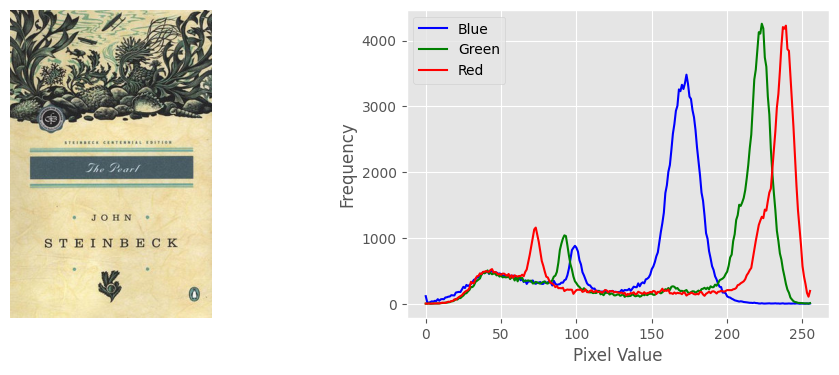

In [ ]:
# From the Test directory we will take an image
image_path = os.path.join(TEST_PATH, os.listdir(TEST_PATH)[1])

# Calculate the combined histogram
histogram = get_histogram(image_path, 256)

# Load the image in BGR format
image = cv2.imread(image_path)

# Convert the image from BGR to RGB for display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Create a subplot with the image on the left
plt.figure(figsize = (12, 4))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.axis('off')

# Create a subplot with the combined histogram on the right
plt.subplot(1, 2, 2)
histograms_per_channel = np.split(histogram, 3)

# Plot the histograms per channel
channels = ['Blue', 'Green', 'Red']
colors = ['b', 'g', 'r']

for i, channel_hist in enumerate(histograms_per_channel):
    plt.plot(channel_hist, color=colors[i], label=channels[i])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### **Step four:** Search for the closest images in the set of images by comparing the histograms with either Euclidean distance or cosine similarity. For each question, display the 4 closest images. Use matplotlib to display the results. What you need to know about this library is that it loads images in **B**lue **G**reen **R**ed (BGR) format and not the classic RGB mentioned earlier. You will need to transform each image (mainly flipping with the flip() command of the numpy library) to display correctly in the output.

In [ ]:
# Find similarities
similarities = cosine_similarity(histogram_df)

In [ ]:
# We are going to use the function that was made in a previous question
dictionary = make_dictionary(similarities, 4)

In [ ]:
def find_similar(id):
  # We check that the id is a valid one
  try:
    # Then we get its position which is then used to return the similar covers
    index_position = histogram_df.index.get_loc(id)
    # print(f"The index '{id}' is located at position: {index_position}")
    return [(index_position, 0)]+ dictionary[index_position]
  except KeyError:
    print(f"The book cover \"{id}\" is not valid.")
    return None

In [ ]:
def display_images(df, PATH, image_ids):
  if image_ids is None:
    return
  # Create a figure with subplots to display the images
  fig, axes = plt.subplots(1, len(image_ids), figsize = (12, 4))
  for i, (image_id, _) in enumerate(image_ids):
    # Construct the path to the image file
    index_value = df.index[image_id]
    image_path = os.path.join(PATH, index_value)
    # Read the image using OpenCV
    image = cv2.imread(image_path)
    # Convert the image from BGR to RGB for correct display
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Display the image on the corresponding subplot
    axes[i].imshow(image)
    # Turn off the axes labels for cleaner visualization
    axes[i].axis("off")
  # Show the plotted images
  plt.show()

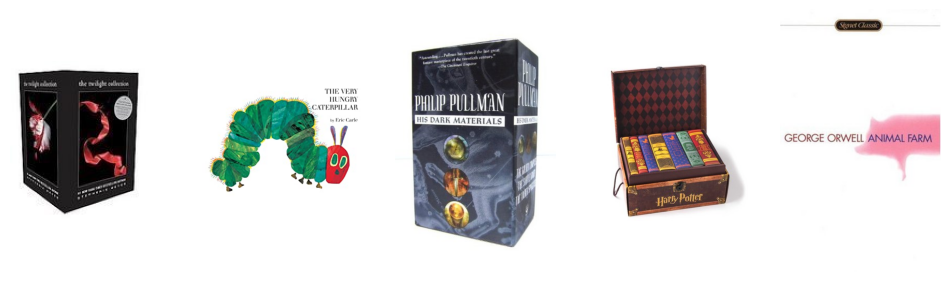

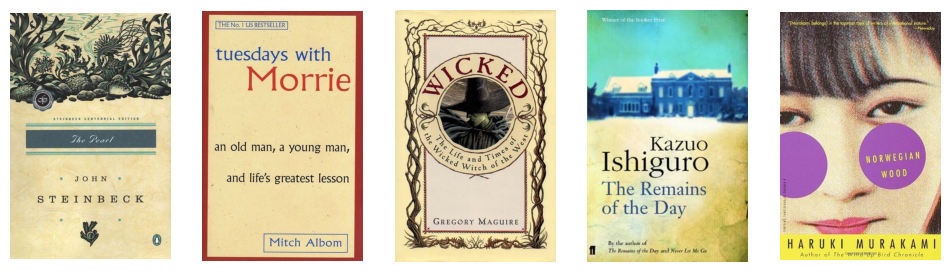

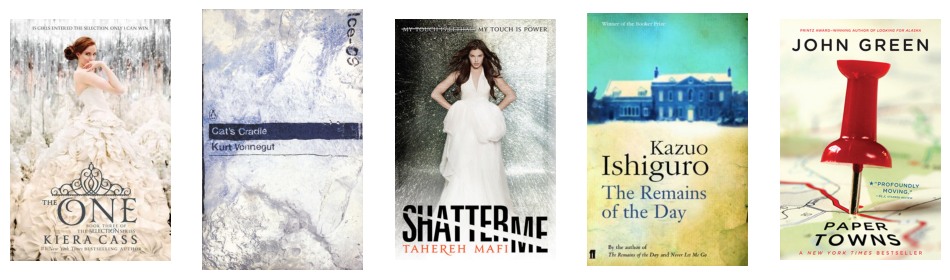

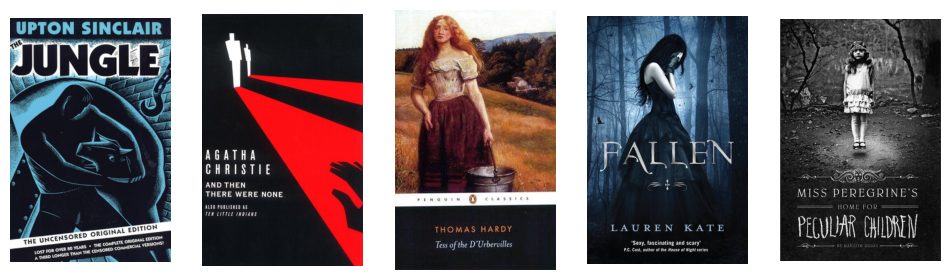

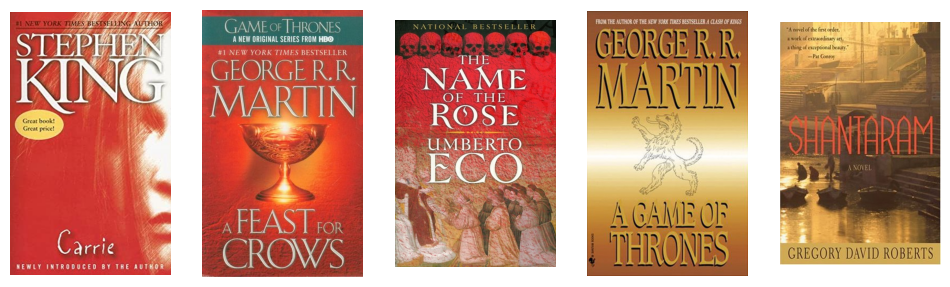

...

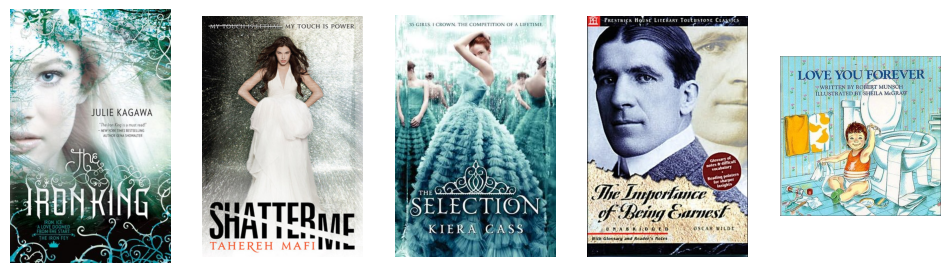

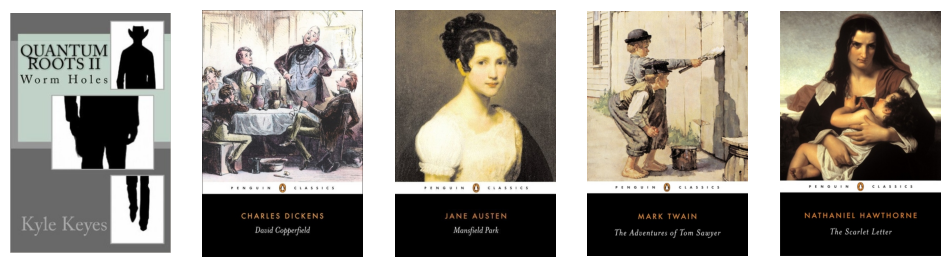

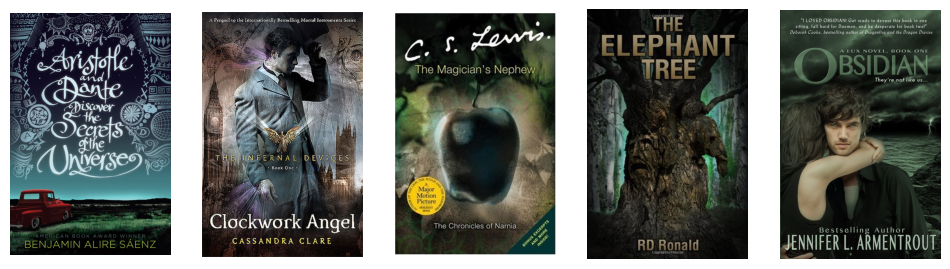

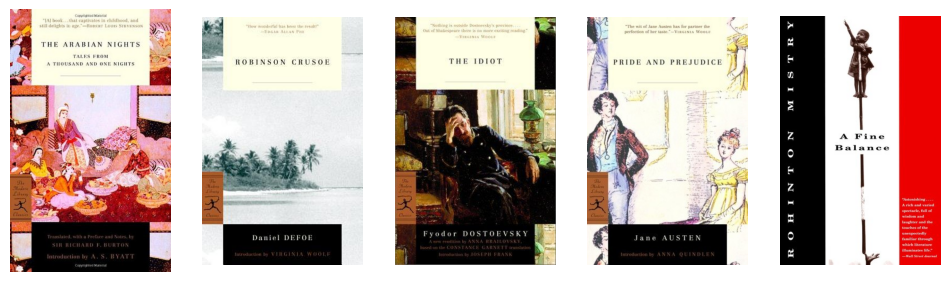

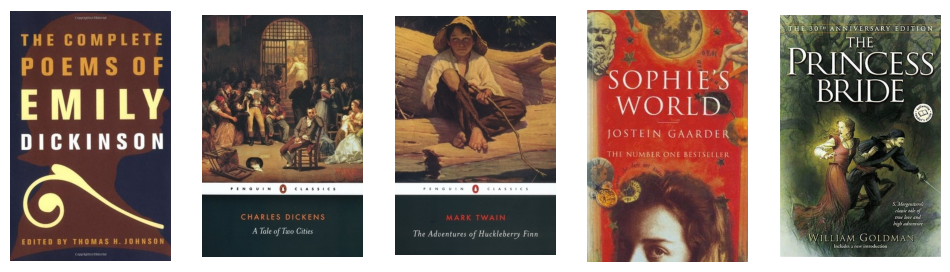

In [ ]:
# Finally I made a loop which runs for all the images in the test directory
# The first image of every row is the test image and the other four images
# are sorted from the most similar to the least
for image in os.listdir(TEST_PATH):
  display_images(histogram_df, TRAIN_PATH, find_similar(image))